## SF crime data analysis and modeling 


 (https://data.sfgov.org/Public-Safety/Police-Department-Incident-Reports-Historical-2003/tmnf-yvry). 

In [0]:
from csv import reader
from pyspark.sql import Row 
from pyspark.sql import SparkSession
from pyspark.sql.types import *
import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt
import warnings

import os
os.environ["PYSPARK_PYTHON"] = "python3"


## Download Dataset here. If data already exists, just skip this cell

In [0]:
# 从SF gov 官网读取下载数据
# 不要反复执行，大家执行一次就好了啊
# 第二次记得comment 掉
import urllib.request
# urllib.request.urlretrieve("https://data.sfgov.org/api/views/tmnf-yvry/rows.csv?accessType=DOWNLOAD", "/tmp/myxxxx.csv")
# dbutils.fs.mv("file:/tmp/myxxxx.csv", "dbfs:/laioffer/spark_hw1/data/sf_03_18.csv")
display(dbutils.fs.ls("dbfs:/laioffer/spark_hw1/data/"))

## 或者自己下载
# https://data.sfgov.org/api/views/tmnf-yvry/rows.csv?accessType=DOWNLOAD


path,name,size
dbfs:/laioffer/spark_hw1/data/sf_03_18.csv,sf_03_18.csv,559169754


In [0]:
data_path = "dbfs:/laioffer/spark_hw1/data/sf_03_18.csv"
# use this file name later

### Solove  big data issues via Spark
approach 1: use RDD (not recommend)  
approach 2: use Dataframe, register the RDD to a dataframe (recommend for DE)  
approach 3: use SQL (recomend for data analysis or DS， 基础比较差的同学)  
***note***: you only need to choose one of approaches as introduced above

In [0]:

# from pyspark.sql import SparkSession
# spark = SparkSession \
#     .builder \
#     .appName("crime analysis") \
#     .config("spark.some.config.option", "some-value") \
#     .getOrCreate()

# df_opt1 = spark.read.format("csv").option("header", "true").load(data_path)
# display(df_opt1)
# df_opt1.createOrReplaceTempView("sf_crime")



## helper function to transform the date, choose your way to do it. 
## 老师我真的是操心了。。。 
# refer: https://jaceklaskowski.gitbooks.io/mastering-spark-sql/spark-sql-functions-datetime.html
# 方法1 使用系统自带udf
# from pyspark.sql.functions import to_date, to_timestamp, hour
# df_opt1 = df_opt1.withColumn('Date', to_date(df_opt1.OccurredOn, "MM/dd/yy"))
# df_opt1 = df_opt1.withColumn('Time', to_timestamp(df_opt1.OccurredOn, "MM/dd/yy HH:mm"))
# df_opt1 = df_opt1.withColumn('Hour', hour(df_opt1['Time']))
# df_opt1 = df_opt1.withColumn("DayOfWeek", date_format(df_opt1.Date, "EEEE"))

## 方法2 手工写udf 
#from pyspark.sql.functions import col, udf
#from pyspark.sql.functions import expr
#from pyspark.sql.functions import from_unixtime

#date_func =  udf (lambda x: datetime.strptime(x, '%m/%d/%Y'), DateType())
#month_func = udf (lambda x: datetime.strptime(x, '%m/%d/%Y').strftime('%Y/%m'), StringType())

#df = df_opt1.withColumn('month_year', month_func(col('Date')))\
#           .withColumn('Date_time', date_func(col('Date')))

## 方法3 手工在sql 里面
# select Date, substring(Date,7) as Year, substring(Date,1,2) as Month from sf_crime


## 方法4: 使用系统自带
# from pyspark.sql.functions import *
# df_update = df_opt1.withColumn("Date", to_date(col("Date"), "MM/dd/yyyy")) ##change datetype from string to date
# df_update.createOrReplaceTempView("sf_crime")
# crimeYearMonth = spark.sql("SELECT Year(Date) AS Year, Month(Date) AS Month, FROM sf_crime")

## Load and read the raw Dataset here

In [0]:

from pyspark.sql import SparkSession
from pyspark.sql.functions import to_date, to_timestamp, hour
from pyspark.sql.functions import year, month, dayofmonth, date_format
from pyspark.sql.functions import from_unixtime, unix_timestamp
# create SparkSession entry to handle data
spark = SparkSession \
    .builder \
    .appName("crime analysis") \
    .config("spark.some.config.option", "some-value") \
    .getOrCreate()
# load csv data and create a table called sf_crime
df_opt1 = spark.read.option("header", "true").csv(data_path)


# # decompose date
df_opt1 = df_opt1.withColumn('Hour', hour(df_opt1['Time']))
# convert string to date type using unix_timestamp
df_opt1 = df_opt1.withColumn("Date",  to_date( from_unixtime(unix_timestamp(df_opt1['Date'], 'MM/dd/yyy'))))
df_opt1 = df_opt1.withColumn("Year",  year(df_opt1.Date))
df_opt1 = df_opt1.withColumn("Month",  month(df_opt1.Date))
df_opt1 = df_opt1.withColumn("Day",  dayofmonth(df_opt1.Date))
df_opt1 = df_opt1.withColumn('HasCriminal', (df_opt1["category"]!="NON-CRIMINAL"))
df_opt1 = df_opt1.withColumn("X",  df_opt1["X"].cast("double"))
df_opt1 = df_opt1.withColumn("Y",  df_opt1["Y"].cast("double"))

# Using UDF: user define function to convert string to date type
# from pyspark.sql.functions import col, udf
# from pyspark.sql.functions import expr
# from pyspark.sql.functions import from_unixtime 
# import datetime
# date_func =  udf (lambda x: datetime.datetime.strptime(x, '%m/%d/%Y'), DateType())
# month_func = udf (lambda x: datetime.datetime.strptime(x, '%m/%d/%Y').strftime('%Y/%m'), StringType())

# df_opt1= df_opt1.withColumn('month_year', month_func(col('Date')))\
#           .withColumn('Date_time', date_func(col('Date')))

# import datetime
# print(datetime.datetime.today())
df_opt1.createOrReplaceTempView('sf_crime')
display(df_opt1)


PdId,IncidntNum,Incident Code,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,location,SF Find Neighborhoods 2 2,Current Police Districts 2 2,Current Supervisor Districts 2 2,Analysis Neighborhoods 2 2,DELETE - Fire Prevention Districts 2 2,DELETE - Police Districts 2 2,DELETE - Supervisor Districts 2 2,DELETE - Zip Codes 2 2,DELETE - Neighborhoods 2 2,DELETE - 2017 Fix It Zones 2 2,Civic Center Harm Reduction Project Boundary 2 2,Fix It Zones as of 2017-11-06 2 2,DELETE - HSOC Zones 2 2,Fix It Zones as of 2018-02-07 2 2,"CBD, BID and GBD Boundaries as of 2017 2 2","Areas of Vulnerability, 2016 2 2",Central Market/Tenderloin Boundary 2 2,Central Market/Tenderloin Boundary Polygon - Updated 2 2,HSOC Zones as of 2018-06-05 2 2,OWED Public Spaces 2 2,Neighborhoods 2,Hour,Year,Month,Day,HasCriminal
11087941463010,110879414,63010,WARRANTS,WARRANT ARREST,Friday,2011-07-01,08:00,NORTHERN,"ARREST, BOOKED",3400 Block of PIERCE ST,-122.439757857075,37.8021507619169,POINT (-122.43975785707501 37.8021507619169),17,4,6,13,13,9,1,57,17,null,null,null,null,null,null,1,null,null,null,null,17,8,2011,7,1,true
5117770316010,051177703,16010,DRUG/NARCOTIC,POSSESSION OF MARIJUANA,Tuesday,2005-10-18,14:30,TENDERLOIN,"ARREST, BOOKED",0 Block of UNITEDNATIONS PZ,-122.414317857881,37.7799444052046,POINT (-122.414317857881 37.7799444052046),21,5,10,36,7,10,9,28852,36,3,1,3,1,3,6,2,1,1,1,39,21,14,2005,10,18,true
5011209707055,050112097,07055,VEHICLE THEFT,RECOVERED VEHICLE - STOLEN OUTSIDE SF,Saturday,2005-01-29,13:45,BAYVIEW,NONE,1500 Block of KIRKWOOD AV,-122.388798895151,37.7375755833256,POINT (-122.38879889515101 37.7375755833256),86,2,9,1,10,3,8,58,1,null,null,null,null,null,null,2,null,null,null,null,86,13,2005,1,29,true
11044468164020,110444681,64020,NON-CRIMINAL,"AIDED CASE, MENTAL DISTURBED",Thursday,2011-06-02,02:52,CENTRAL,PSYCHOPATHIC CASE,900 Block of COLUMBUS AV,-122.414354301151,37.8031089840376,POINT (-122.41435430115101 37.8031089840376),107,6,3,32,3,1,10,308,32,null,null,null,null,null,null,1,null,null,null,null,107,2,2011,6,2,false
3038311107024,030383111,07024,VEHICLE THEFT,STOLEN TRAILER,Saturday,2003-02-01,08:00,BAYVIEW,NONE,1500 Block of BAY SHORE BL,-122.401096851568,37.7245556697717,POINT (-122.401096851568 37.7245556697717),86,2,9,1,10,3,8,58,1,null,null,null,null,null,null,2,null,null,null,null,86,8,2003,2,1,true
6018621406243,060186214,06243,LARCENY/THEFT,PETTY THEFT FROM LOCKED AUTO,Sunday,2006-02-12,17:00,CENTRAL,NONE,400 Block of DAVIS CT,-122.398187664281,37.7967148853927,POINT (-122.39818766428101 37.7967148853927),77,6,3,8,3,1,10,28860,6,null,null,null,null,null,null,1,null,null,null,null,77,17,2006,2,12,true
9606640606374,096066406,06374,LARCENY/THEFT,GRAND THEFT OF PROPERTY,Thursday,2009-08-06,22:00,RICHMOND,NONE,2000 Block of BAKER ST,-122.444143357971,37.7899090887789,POINT (-122.44414335797102 37.7899090887789),102,8,6,30,13,6,1,29490,27,null,null,null,null,null,null,1,null,null,null,null,102,22,2009,8,6,true
10037601606304,100376016,06304,LARCENY/THEFT,GRAND THEFT FROM A BUILDING,Friday,2010-04-23,16:30,MISSION,NONE,2600 Block of MISSION ST,-122.41860030589,37.7546255872838,POINT (-122.41860030589001 37.7546255872838),53,3,2,20,2,4,7,28859,19,null,null,null,3,null,null,2,null,null,3,null,53,16,2010,4,23,true
5118607706244,051186077,06244,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Thursday,2005-10-20,11:00,SOUTHERN,NONE,800 Block of BRYANT ST,-122.403404791479,37.775420706711,POINT (-122.40340479147902 37.775420706711),32,1,10,34,14,2,9,28853,34,null,null,null,null,null,null,2,null,null,null,null,32,11,2005,10,20,true
12038512205053,120385122,05053,BURGLARY,"BURGLARY OF STORE, UNLAWFUL ENTRY",Thursday,2012-05-03,10:00,SOUTHERN,NONE,600 Block of 2ND ST,-122.39123835272,37.7812532736369,POINT (-122.39123835272001 37.7812532736369),31,1,10,8,6,2,9,28856,6,null,null,null,null,null,null,1,null,null,null,null,31,10,2012,5,3,true


#### Q1 question (OLAP): 
#####Write a Spark program that counts the number of crimes for different category.

Below are some example codes to demonstrate the way to use Spark RDD, DF, and SQL to work with big data. You can follow this example to finish other questions. 


In [0]:
q1_result = df_opt1.groupBy('category').count().orderBy('count', ascending=False)
display(q1_result)

category,count
LARCENY/THEFT,477975
OTHER OFFENSES,303027
NON-CRIMINAL,236937
ASSAULT,191384
VEHICLE THEFT,126228
DRUG/NARCOTIC,117875
VANDALISM,114718
WARRANTS,99821
BURGLARY,91067
SUSPICIOUS OCC,79740


In [0]:
#Spark SQL based
crimeCategory = spark.sql("SELECT  category, COUNT(*) AS Count FROM sf_crime GROUP BY category ORDER BY Count DESC")
display(crimeCategory)

category,Count
LARCENY/THEFT,477975
OTHER OFFENSES,303027
NON-CRIMINAL,236937
ASSAULT,191384
VEHICLE THEFT,126228
DRUG/NARCOTIC,117875
VANDALISM,114718
WARRANTS,99821
BURGLARY,91067
SUSPICIOUS OCC,79740


In [0]:
# important hints: 
## first step: spark df or sql to compute the statisitc result 
## second step: export your result to a pandas dataframe. 
crimeCategory = spark.sql("SELECT  category, COUNT(*) AS crime_counts FROM sf_crime GROUP BY category ORDER BY crime_counts DESC")
crimes_pd_df = crimeCategory.toPandas()
display(crimeCategory)

# Spark does not support this function, please refer https://matplotlib.org/ for visuliation. You need to use display to show the figure in the databricks community. 
#display(p)

category,crime_counts
LARCENY/THEFT,477975
OTHER OFFENSES,303027
NON-CRIMINAL,236937
ASSAULT,191384
VEHICLE THEFT,126228
DRUG/NARCOTIC,117875
VANDALISM,114718
WARRANTS,99821
BURGLARY,91067
SUSPICIOUS OCC,79740


#### Q1.1 Visualize the count of crime of each category using barplot
1. Since there are 37 categories , which is hard to plot when setting x= category,  so I use hue/series grouping = category to plot it instead

In [0]:
#pyspark base method to visualize data
crime_category_df = df_opt1.groupby('category').count().orderBy('count',ascending=False)
crime_category_df = crime_category_df.withColumnRenamed('count', 'crime_counts')
crime_category_df = crime_category_df.toPandas()
# import seaborn as sns
# sns.barplot(x = crime_category_df['count'], y = crime_category_df['category'])
display(crime_category_df)

category,crime_counts
LARCENY/THEFT,477975
OTHER OFFENSES,303027
NON-CRIMINAL,236937
ASSAULT,191384
VEHICLE THEFT,126228
DRUG/NARCOTIC,117875
VANDALISM,114718
WARRANTS,99821
BURGLARY,91067
SUSPICIOUS OCC,79740


#### Q2 question (OLAP)
Counts the number of crimes for different district, and visualize your results


#### Q2.1 Using PySpark + SQL method

In [0]:

crime_district_df = spark.sql("select distinct PdDistrict, count(PdDistrict) as crime_counts from \
          ( select  PdDistrict, Category \
            from sf_crime \
            where (Category != 'NON-CRIMINAL') \
            )\
            group by PdDistrict \
            order by crime_counts desc ;")
display(crime_district_df)

PdDistrict,crime_counts
SOUTHERN,344530
MISSION,261470
NORTHERN,242847
CENTRAL,195387
BAYVIEW,194866
TENDERLOIN,170287
INGLESIDE,169212
TARAVAL,140431
PARK,105662
RICHMOND,99323


#### Q2.2 Using PySpark DataFrame Method

In [0]:
crime_counts = df_opt1.where(df_opt1['category']!= 'NON-CRIMINAL').groupby(['PdDistrict']).count().orderBy('count', ascending= False)
crime_counts = crime_counts.select(['PdDistrict','count']).withColumnRenamed('count','crime_counts')
display(crime_counts)

PdDistrict,crime_counts
SOUTHERN,344530
MISSION,261470
NORTHERN,242847
CENTRAL,195387
BAYVIEW,194866
TENDERLOIN,170287
INGLESIDE,169212
TARAVAL,140431
PARK,105662
RICHMOND,99323


#### Q3 question (OLAP)
Count the number of crimes each "Sunday" at "SF downtown".   
hint 1: SF downtown is defiend  via the range of spatial location. For example, you can use a rectangle to define the SF downtown, or you can define a cicle with center as well. Thus, you need to write your own UDF function to filter data which are located inside certain spatial range. You can follow the example here: https://changhsinlee.com/pyspark-udf/

hint 2: SF downtown 物理范围可以是 rectangle a < x < b  and c < y < d. thus, San Francisco Latitude and longitude coordinates are: 37.773972, -122.431297. X and Y represents each. So we assume SF downtown spacial range: X (-122.4213,-122.4313), Y(37.7540,37.7740). 也可以是中心一个圈，距离小于多少算做downtown
 

#### Q3.1 Using PySpark Dataframe + SQL Method

In [0]:
crime_downtown_df =  spark.sql("select Date, DayOfWeek, count(category) as crime_counts from (\
                               select  DayOfWeek, Date, Year, Month, Day, category from sf_crime \
          where (X <-122.4213) and (X >-122.4313) and (Y>37.7540) and (Y< 37.7740) and (DayOfWeek = 'Sunday') and (Category != 'NON-CRIMINAL') )\
          group by DayOfWeek, Date, Year, Month, Day \
          order by Date asc\
          ;")

display(crime_downtown_df)
                              
                              
                              
# -- X >-122.4213 and X <-122.4313 and Y>37.7540 and Y< 37.7740"


Date,DayOfWeek,crime_counts
2003-01-05,Sunday,14
2003-01-12,Sunday,17
2003-01-19,Sunday,15
2003-01-26,Sunday,12
2003-02-02,Sunday,13
2003-02-09,Sunday,20
2003-02-16,Sunday,12
2003-02-23,Sunday,13
2003-03-02,Sunday,14
2003-03-09,Sunday,7


#### Q3.2 Using Pyspark DataFrame Method

In [0]:
# select SF downtown by X, Y position (longtitude, latitude) with X in (-122.4313, -122.4213 ),  Y in (37.7540, 37.7740 )
sf_downtown_df = df_opt1.where("X < -122.4213 and X > -122.4313 and Y< 37.7740 and Y>37.7540 ")
# count the number of crime in sunday of SF downtown
sf_downtown_df = sf_downtown_df.where("DayOfWeek = 'Sunday' and hasCriminal=true").groupby(['Date','DayofWeek']).count().orderBy('Date',ascending=True)
sf_downtown_df = sf_downtown_df.withColumnRenamed("count", "crime_count")
display(sf_downtown_df)

Date,DayofWeek,crime_count
2003-01-05,Sunday,14
2003-01-12,Sunday,17
2003-01-19,Sunday,15
2003-01-26,Sunday,12
2003-02-02,Sunday,13
2003-02-09,Sunday,20
2003-02-16,Sunday,12
2003-02-23,Sunday,13
2003-03-02,Sunday,14
2003-03-09,Sunday,7


#### Q4 question (OLAP)
Analysis the number of crime in each month of 2015, 2016, 2017, 2018. Then, give your insights for the output results. What is the business impact for your result?  

In [0]:
# extract data of 2015, 2016,2017, 2018 from table
years =[2015, 2016, 2017, 2018]
crime_years_df = df_opt1.where(df_opt1.Year.isin(years)).select(["Year", "Month","category","HasCriminal"])
display(crime_years_df)

Year,Month,category,HasCriminal
2015,12,ASSAULT,true
2015,9,WARRANTS,true
2017,9,LARCENY/THEFT,true
2015,9,SUSPICIOUS OCC,true
2017,10,VANDALISM,true
2015,9,VANDALISM,true
2015,9,VEHICLE THEFT,true
2015,9,LARCENY/THEFT,true
2015,9,FRAUD,true
2015,9,LARCENY/THEFT,true


#### Compare the count of crime in each month among 2015,2016,2017,2018 using barplot

In [0]:
# select the rows that have criminal events and then count them for each month in years 2015~2018 
hasCrime_count = crime_years_df.where("HasCriminal=true").groupby(["Year","Month"]).count().orderBy(["Year", "Month"],ascending=True)
hasCrime_count = hasCrime_count.withColumnRenamed('count', 'crime_count')
hasCrime_count_pd = hasCrime_count.toPandas()

NonCrime_count = crime_years_df.where("HasCriminal=false").groupby(["Year","Month"]).count().orderBy(["Year", "Month"],ascending=True)
NonCrime_count = NonCrime_count.withColumnRenamed('count', 'Non-criminal_count')
NonCrime_count_pd = NonCrime_count.toPandas()
display(hasCrime_count)


Year,Month,crime_count
2015,1,11698
2015,2,10505
2015,3,11946
2015,4,11082
2015,5,11886
2015,6,11495
2015,7,11570
2015,8,11804
2015,9,11077
2015,10,11312


In [0]:
display(df_opt1.where("Year =2018").groupby(["Month"]).count().orderBy(["Month"]))

Month,count
1,11838
2,9744
3,10545
4,10138
5,3576


#### To see the change of count of crime of each year using line plot

In [0]:
display(hasCrime_count)

Year,Month,crime_count
2015,1,11698
2015,2,10505
2015,3,11946
2015,4,11082
2015,5,11886
2015,6,11495
2015,7,11570
2015,8,11804
2015,9,11077
2015,10,11312


#### Analysis
1. **Information obtained from each plot**
  + In the bar plot, we can see that the amount of crime in 2018 is decreasing and smaller than 2015~2017 and there are only 5 months in 2018 recored
  + In the line plot, compared with 2015, 2017, there are less amount of crime in 2016 from Jan to Sep.
  + The amount of crime first decrease at the end of 2015 (Oct 2015 ) to the middle of 2016  (July 2016) and then it increases again from Sep 2016 to 2017
  
2. **Business Insight**
  + It is possible that there are some social well-being or benefit or good policy released to help people's life so that the amount of crime decreases in short-term
  + In 2015, the decreasing amount of crime in November to December may be due to the Chrismas Holiday and most of people stay at home
  + If the observation that the amount of crime in 2018 decreases dramatically from Jan to May is correct, rather than missing records, then it is possible that some polices released to control the amount of crime and the regions in the report will be safer than before. 
   In this case, it is good for people to travel in those regions.
  Moreover, it may be a good chance for travel companies to introduce those places of visit to customers and earn more benefit

#### Q5 question (OLAP)
Analysis the number of crime w.r.t the hour in certian day like 2015/12/15, 2016/12/15, 2017/12/15. Then, give your travel suggestion to visit SF. 

In [0]:
date_ls = ["2015-12-15", "2016-12-15","2017-12-15"]

sf_downtown_df = df_opt1.where("X < -122.4213 and X > -122.4313 and Y< 37.7740 and Y>37.7540 ").where(sf_downtown_df.Date.isin(date_ls))
sf_crime_count_df = sf_downtown_df.where("hasCriminal = true").groupby(['Date','Hour','DayOfWeek']).count().orderBy([ "Hour"], ascending=True)
sf_crime_count_df = sf_crime_count_df.withColumnRenamed("count", "crime_count")
sf_crime_count_df = sf_crime_count_df.toPandas()
display(sf_crime_count_df)

Date,Hour,DayOfWeek,crime_count
2017-12-15,0,Friday,1
2017-12-15,2,Friday,3
2016-12-15,2,Thursday,3
2015-12-15,4,Tuesday,3
2016-12-15,7,Thursday,1
2016-12-15,8,Thursday,3
2017-12-15,8,Friday,1
2016-12-15,9,Thursday,1
2017-12-15,12,Friday,1
2016-12-15,12,Thursday,1


#### Analysis
1. In 2017-12-15, it is easy to see that most of crimes occur around 2 am at night and the every hour has the possibility of the occurence of crime
2. In 2016-12-15, most of crimes occur either at night around 2am or in morning 8am or afternoon around 14:00.
3. In 2015-12-15, most of crimes occur at night from 18pm to 4am.

#### Suggestions
1. If travel on 2017-12-15 Friday, it is recommanded to travel around 7am to 13 pm
2. It is not recommanded to travel in 2016-12-15
3. On 2015-12-15 Tuesday, it is suggested to travel around 7am to 13pm as there is less possible to meet crime compared with other dates.


#### Q6 question (OLAP)
(1) Step1: Find out the top-3 danger disrict  
(2) Step2: find out the crime event w.r.t category and time (hour) from the result of step 1  
(3) give your advice to distribute the police based on your analysis results. 


#### Assumption
1. assume the "danger" mentioned here is measured by the count of criminal in the district

In [0]:
# choose the names of the 3 most dangers district. Then the top-3 danger district is the last one
danger_district_pd = df_opt1.where("hasCriminal =true").groupby([ "PdDistrict"]).count().orderBy(["count"],ascending=False).limit(3).toPandas()["PdDistrict"].tolist()[-1]
# find the crime event
crime_events= df_opt1.where("hasCriminal=true").where(df_opt1.PdDistrict == danger_district_pd).select(["PdDistrict","category","Hour"])
crime_events = crime_events.groupby(["PdDistrict","category","Hour"]).count().orderBy(["Hour"], ascending=True)
crime_events = crime_events.withColumnRenamed('count',"crime_count")
display(crime_events)

PdDistrict,category,Hour,crime_count
NORTHERN,DRUNKENNESS,0,75
NORTHERN,ARSON,0,18
NORTHERN,ASSAULT,0,1196
NORTHERN,VEHICLE THEFT,0,458
NORTHERN,RECOVERED VEHICLE,0,43
NORTHERN,STOLEN PROPERTY,0,104
NORTHERN,ROBBERY,0,365
NORTHERN,DRUG/NARCOTIC,0,476
NORTHERN,LARCENY/THEFT,0,3373
NORTHERN,BURGLARY,0,618


In [0]:
display(crime_events)

PdDistrict,category,Hour,crime_count
NORTHERN,LARCENY/THEFT,19,6816
NORTHERN,LARCENY/THEFT,18,6714
NORTHERN,LARCENY/THEFT,20,5893
NORTHERN,LARCENY/THEFT,17,5191
NORTHERN,LARCENY/THEFT,21,4946
NORTHERN,LARCENY/THEFT,22,4724
NORTHERN,LARCENY/THEFT,16,4392
NORTHERN,LARCENY/THEFT,23,4309
NORTHERN,LARCENY/THEFT,12,4200
NORTHERN,LARCENY/THEFT,15,4097


#### Analysis
1. The frequent crime events are Larceny/theft, vehicle theft, Other Offenses, assault, buglary, Drug
2. It is easy to see that The most frequent crime event is larceny/theft.  The amount of LARCENY/THEFT increases from 6 am to 23 pm and decreases from 0:00 to 4 am. Most of theft events occur at night. The amount reach a peak in 18pm ~20pm
3. Other offenses and assault occur frequently during 8pm to 0:00am, but the frequency of Other offenses is greate than assault.
4. Vehicle theft events also occurs frequently at night and the amount increases during 14pm ~18pm and decrease from 0~4am.
5. The period 2am ~ 6am has the least amount of crime

#### Suggestions based on analysis above
1. Distribute more polices during 18~22pm since most of crimes occur most frequently in this period
2. Distribute more polices to handle Larceny/theft, vehicle theft, Other Offenses, assault, buglary, Drug,   Especifically, Larceny/theft
3. Can distribute less polices during 4am ~ 6am and let polices take a rest in this duration

#### Q7 question (OLAP)
For different category of crime, find the percentage of resolution. Based on the output, give your hints to adjust the policy.

#### 7.1 Using PySpark with SQL method

In [0]:
percentage_df = df_opt1.where("hasCriminal=true").groupby(["category","Resolution"]).count().orderBy(["count"], descending=True)
percentage_df.createOrReplaceTempView('resolution_count')
percentage_df = spark.sql("with category_count as (select category, sum(count) as total_counts from resolution_count group by category) \
select  a.category, b.Resolution, b.count, a.total_counts, 100*b.count/a.total_counts as percentage from (category_count a \
left join resolution_count b on a.category = b.category \
)")
display(percentage_df)

category,Resolution,count,total_counts,percentage
FRAUD,PSYCHOPATHIC CASE,10,41348,0.02418496662474606
FRAUD,PROSECUTED FOR LESSER OFFENSE,2,41348,0.004836993324949211
FRAUD,COMPLAINANT REFUSES TO PROSECUTE,46,41348,0.11125084647383186
FRAUD,LOCATED,7,41348,0.01692947663732224
FRAUD,PROSECUTED BY OUTSIDE AGENCY,881,41348,2.130695559640128
FRAUD,EXCEPTIONAL CLEARANCE,129,41348,0.31198606945922414
FRAUD,NONE,32057,41348,77.52974750894843
FRAUD,"ARREST, BOOKED",4940,41348,11.947373512624553
FRAUD,NOT PROSECUTED,1940,41348,4.691883525200735
FRAUD,"ARREST, CITED",921,41348,2.227435426139112


#### 7.2 Using PySpark DataFrame Only

In [0]:
resol_df = df_opt1.where("hasCriminal=true").groupby(["category","Resolution"]).count().orderBy(["count"], descending=True).withColumnRenamed('count','resol_count')
category_df = df_opt1.where("hasCriminal=true").groupby(["category"]).count().withColumnRenamed('count','category_count')
perc_df = category_df.join(resol_df, resol_df.category == category_df.category,'left')
perc_df = perc_df.withColumn('percentage', 100.0*perc_df.resol_count/perc_df.category_count)
display(perc_df)

category,category_count,category,Resolution,resol_count,percentage
FRAUD,41348,FRAUD,PSYCHOPATHIC CASE,10,0.02418496662474606
FRAUD,41348,FRAUD,PROSECUTED FOR LESSER OFFENSE,2,0.004836993324949211
FRAUD,41348,FRAUD,COMPLAINANT REFUSES TO PROSECUTE,46,0.11125084647383186
FRAUD,41348,FRAUD,LOCATED,7,0.01692947663732224
FRAUD,41348,FRAUD,PROSECUTED BY OUTSIDE AGENCY,881,2.130695559640128
FRAUD,41348,FRAUD,EXCEPTIONAL CLEARANCE,129,0.31198606945922414
FRAUD,41348,FRAUD,NONE,32057,77.52974750894843
FRAUD,41348,FRAUD,"ARREST, BOOKED",4940,11.947373512624553
FRAUD,41348,FRAUD,NOT PROSECUTED,1940,4.691883525200735
FRAUD,41348,FRAUD,"ARREST, CITED",921,2.227435426139112


#### 7.2.1 Convert PySpark to Pandas and then visualize data, since using pandas is faster than pyspark  when visualizing data
1. Since there are 37 categories of crime, it is hard to visualize the resolution of each case.  In the barplot above, though we can vsisualize and analyze the  percentage of each category of crime, the graph is still very dense. Hence I try to use pie chart to visualize each category and crime in the following
2. In the following steps,  I break dataframe into several groups based on category and then visualize them using pie chart. Each group contains 4 category of crime. I take the first 5 groups as examples to analyze.(If i visualize all groups, it will need to show 10 groups) 


In [0]:
# Convert pyspark dataframe to pandas dataframe and drop duplicated columns

perc_df_pd = perc_df.toPandas()
perc_df_pd = perc_df_pd.loc[:,~perc_df_pd.columns.duplicated()]

In [0]:
print("Number of categories: ", len(perc_df_pd .category.unique()))
print("Number of Resolution: ",len(perc_df_pd.Resolution.unique()))
print("\n")
print("Categories:")
print(perc_df_pd .category.unique())
print("Resolution::")
print(perc_df_pd .Resolution.unique())

Number of categories: 37
Number of Resolution: 12
Categories:
['FRAUD' 'SUICIDE' 'LIQUOR LAWS' 'SECONDARY CODES' 'FAMILY OFFENSES'
 'MISSING PERSON' 'OTHER OFFENSES' 'DRIVING UNDER THE INFLUENCE'
 'WARRANTS' 'ARSON' 'FORGERY/COUNTERFEITING' 'GAMBLING' 'BRIBERY'
 'ASSAULT' 'DRUNKENNESS' 'EXTORTION' 'TREA' 'WEAPON LAWS' 'LOITERING'
 'SUSPICIOUS OCC' 'ROBBERY' 'SEX OFFENSES, FORCIBLE' 'PROSTITUTION'
 'EMBEZZLEMENT' 'BAD CHECKS' 'DISORDERLY CONDUCT' 'RECOVERED VEHICLE'
 'VANDALISM' 'DRUG/NARCOTIC' 'PORNOGRAPHY/OBSCENE MAT' 'TRESPASS'
 'VEHICLE THEFT' 'STOLEN PROPERTY' 'LARCENY/THEFT' 'KIDNAPPING' 'BURGLARY'
 'SEX OFFENSES, NON FORCIBLE']
Resolution::
['PSYCHOPATHIC CASE' 'PROSECUTED FOR LESSER OFFENSE'
 'COMPLAINANT REFUSES TO PROSECUTE' 'LOCATED'
 'PROSECUTED BY OUTSIDE AGENCY' 'EXCEPTIONAL CLEARANCE' 'NONE'
 'ARREST, BOOKED' 'NOT PROSECUTED' 'ARREST, CITED'
 'DISTRICT ATTORNEY REFUSES TO PROSECUTE' 'UNFOUNDED']

#### Visualize data with pie chart for each category

In [0]:
category_ls = perc_df_pd.category.unique()
num_charts = 4
num_groups = len(category_ls)//num_charts
chart_groups = [category_ls[i*num_charts:(i+1)*num_charts] for i in range(num_groups)]
chart_groups.append(category_ls[num_groups*num_charts :])

display(perc_df_pd[perc_df_pd.category.isin(chart_groups[0]) ])

category,category_count,Resolution,resol_count,percentage
FRAUD,41348,PSYCHOPATHIC CASE,10,0.02418496662474606
FRAUD,41348,PROSECUTED FOR LESSER OFFENSE,2,0.004836993324949211
FRAUD,41348,COMPLAINANT REFUSES TO PROSECUTE,46,0.11125084647383186
FRAUD,41348,LOCATED,7,0.01692947663732224
FRAUD,41348,PROSECUTED BY OUTSIDE AGENCY,881,2.130695559640128
FRAUD,41348,EXCEPTIONAL CLEARANCE,129,0.31198606945922414
FRAUD,41348,NONE,32057,77.52974750894843
FRAUD,41348,"ARREST, BOOKED",4940,11.947373512624553
FRAUD,41348,NOT PROSECUTED,1940,4.691883525200735
FRAUD,41348,"ARREST, CITED",921,2.227435426139112


In [0]:
display(perc_df_pd[perc_df_pd.category.isin(chart_groups[1]) ])

category,category_count,Resolution,resol_count,percentage
FAMILY OFFENSES,926,PROSECUTED BY OUTSIDE AGENCY,3,0.32397408207343414
FAMILY OFFENSES,926,COMPLAINANT REFUSES TO PROSECUTE,4,0.4319654427645788
FAMILY OFFENSES,926,EXCEPTIONAL CLEARANCE,11,1.187904967602592
FAMILY OFFENSES,926,DISTRICT ATTORNEY REFUSES TO PROSECUTE,9,0.9719222462203023
FAMILY OFFENSES,926,PSYCHOPATHIC CASE,8,0.8639308855291576
FAMILY OFFENSES,926,UNFOUNDED,39,4.211663066954643
FAMILY OFFENSES,926,"ARREST, CITED",29,3.1317494600431965
FAMILY OFFENSES,926,"ARREST, BOOKED",320,34.557235421166304
FAMILY OFFENSES,926,NONE,484,52.26781857451404
FAMILY OFFENSES,926,NOT PROSECUTED,17,1.83585313174946


In [0]:
display(perc_df_pd[perc_df_pd.category.isin(chart_groups[2]) ])

category,category_count,Resolution,resol_count,percentage
WARRANTS,99821,COMPLAINANT REFUSES TO PROSECUTE,21,0.021037657406758097
WARRANTS,99821,PSYCHOPATHIC CASE,36,0.036064555554442455
WARRANTS,99821,"ARREST, CITED",885,0.886586990713377
WARRANTS,99821,LOCATED,34,0.03406096913475121
WARRANTS,99821,DISTRICT ATTORNEY REFUSES TO PROSECUTE,36,0.036064555554442455
WARRANTS,99821,UNFOUNDED,132,0.13223670369962232
WARRANTS,99821,PROSECUTED BY OUTSIDE AGENCY,43,0.043077108023361815
WARRANTS,99821,EXCEPTIONAL CLEARANCE,30,0.03005379629536871
WARRANTS,99821,NONE,5482,5.491830376373709
WARRANTS,99821,NOT PROSECUTED,18,0.018032277777221228


In [0]:
display(perc_df_pd[perc_df_pd.category.isin(chart_groups[3]) ])

category,category_count,Resolution,resol_count,percentage
BRIBERY,796,NOT PROSECUTED,1,0.12562814070351758
BRIBERY,796,EXCEPTIONAL CLEARANCE,3,0.3768844221105528
BRIBERY,796,"ARREST, CITED",5,0.628140703517588
BRIBERY,796,UNFOUNDED,5,0.628140703517588
BRIBERY,796,NONE,338,42.462311557788944
BRIBERY,796,DISTRICT ATTORNEY REFUSES TO PROSECUTE,15,1.8844221105527639
BRIBERY,796,COMPLAINANT REFUSES TO PROSECUTE,11,1.3819095477386936
BRIBERY,796,"ARREST, BOOKED",418,52.51256281407035
ASSAULT,191384,DISTRICT ATTORNEY REFUSES TO PROSECUTE,2612,1.3647953851941645
ASSAULT,191384,COMPLAINANT REFUSES TO PROSECUTE,2126,1.1108556619153116


In [0]:
display(perc_df_pd[perc_df_pd.category.isin(chart_groups[4])])

category,category_count,Resolution,resol_count,percentage
TREA,14,"ARREST, CITED",2,14.285714285714286
TREA,14,NONE,6,42.857142857142854
TREA,14,"ARREST, BOOKED",6,42.857142857142854
WEAPON LAWS,21004,PROSECUTED FOR LESSER OFFENSE,1,0.004760997905160921
WEAPON LAWS,21004,"ARREST, CITED",1157,5.508474576271187
WEAPON LAWS,21004,NOT PROSECUTED,66,0.31422586174062084
WEAPON LAWS,21004,UNFOUNDED,156,0.7427156732051038
WEAPON LAWS,21004,PROSECUTED BY OUTSIDE AGENCY,15,0.07141496857741382
WEAPON LAWS,21004,EXCEPTIONAL CLEARANCE,39,0.18567891830127595
WEAPON LAWS,21004,COMPLAINANT REFUSES TO PROSECUTE,45,0.21424490573224148


#### 7.3 Using SQL Method，whose figure is similar to that of pyspark method

In [0]:
%sql
with category_count as (select category, sum(count) as total_counts from resolution_count group by category)
select  a.category, b.Resolution, b.count, a.total_counts, 100*b.count/a.total_counts as percentage from (category_count a
left join resolution_count b on a.category = b.category
)
;


category,Resolution,count,total_counts,percentage
FRAUD,PSYCHOPATHIC CASE,10,41348,0.02418496662474606
FRAUD,PROSECUTED FOR LESSER OFFENSE,2,41348,0.004836993324949211
FRAUD,COMPLAINANT REFUSES TO PROSECUTE,46,41348,0.11125084647383186
FRAUD,LOCATED,7,41348,0.01692947663732224
FRAUD,PROSECUTED BY OUTSIDE AGENCY,881,41348,2.130695559640128
FRAUD,EXCEPTIONAL CLEARANCE,129,41348,0.31198606945922414
FRAUD,NONE,32057,41348,77.52974750894843
FRAUD,"ARREST, BOOKED",4940,41348,11.947373512624553
FRAUD,NOT PROSECUTED,1940,41348,4.691883525200735
FRAUD,"ARREST, CITED",921,41348,2.227435426139112


#### Analysis
1. From the bar plot and pie chart above, we can see that there are many categories of crime that have large percentage of resolution labeled as "NONE" and have not been solved successfully yet. For example:  FRAUD,SUICIDE, SECONDARY CODES,ASSAULT, BRIBERY, EXTORTION, ARSON, FORGERY/COUNTERFEITING, SUSPICIOUS OCC etc.
It is suggested to assign more polices to solve such kind of problems
2. There are some categories of crimes that have been solved, such as WARRANTS, LIQUOR LAWS, DRIVING UNDER THE INFLUENCE,DRUNKENNESS, etc. Maybe they can assign less polices in these cases.
3. Moreover, one interesting observation is that over 80% of WARRANTS, STOLEN PROERTY, DRUG, DRUNKENNESS crimes have been resolved. It seems like they pay high attention to crimes that are related to finance, medicine, Transportation.

### Conclusion. 
Use four sentences to summary your work. Like what you have done, how to do it, what the techinical steps, what is your business impact. 
More details are appreciated. You can think about this a report for your manager. Then, you need to use this experience to prove that you have strong background on big  data analysis.  
Point 1:  what is your story ? and why you do this work ?   
Point 2:  how can you do it ?  keywords: Spark, Spark SQL, Dataframe, Data clean, Data visulization, Data size, clustering, OLAP,   
Point 3:  what do you learn from the data ?  keywords: crime, trend, advising, conclusion, runtime 


## Answers:
#### 1. Story and Movtivation
The motivation of this project is that I have an experience in getting cheated during my trip in New York City. When I tried to transit from an airport to another airport, an unlicensed driver cheated me to take his taxi and took 400 dollars from me as the real cost of the route should be around 100 dollars. This experience reminds me that crimes occur frequently in US, so I want to use Big data technique to analyze the distribution and frequency of the occurence of crime and try to avoid meeting them and putting myself into danger again during my travel.
#### 2. Steps:
1. Choosing Platform and tool
In this project I choose to use **PySpark SQL + PySpark Dataframe method** to load and handle the dataset. The reason is that the dataset has size of more than 500 MB.  To use pandas to handle the whole dataset would be slow since pandas use sequential method to process the data while PySpark provides me with a parallel method to handle and leads to faster speed in processing the dataset. Moveover, **SQL can provide a easy way to load data without checking the many APIs from PySpark, so it is a good way to get start. After I use Spark SQL to load data, I can also use PySpark DataFrame format to get and transform the data into some representations that can be used to train machine learning model in the future**.

2. Data Visualization
After loading data, I use the databricks visualization tool : display() function to visualize the columns in the table. I also use PySpark SQL and DataFrame methods to select the features that I'm interested in, such as the categories, Date, Location of crimes so that I can visualize them and analyze the potential properties and relations among different features.

During the visualization process, I'm interested in the amount of different categories of crimes in different districts, location and hour and the resolution condition of each crime. Then I use SQL and PySpark APIs to select those columns of features and plot the figures. 

For example, I use a **bar plot of Hour-vs- Count of crime at a specific location SF downtown** to visualize the daily amount of crime in SF downtown in 24 hours,which can give me some ideas about how frequent crime may occur in this place. I also use a **bar plot and line plot of the count of crime in different years to see how the amount of crime may change in recent years**. In addition, a **pie chart of percentage of resolution in each category of crime is also used to see which kinds of categories of crime have not been resolved well**. This may give me some ideas about which types of crimes I should pay attention to  when I'm traveling to this place. 


#### 3. Learning from data
1. From the bar plot and line plot of count of crime in 2015~2018, I find that there is a trend of decreasing of crime amount in 2018 from Jan to May and the amount of crime decreases in Nov 2015 to May 2016 and then increases again after July 2016.
2. From the bar plot of Hour -vs- count of crime of different categories, I find that most of crimes occur at night around 16~22pm frequently and the period around 4~6 am is the period that has the least amount of crime, since most of people sleep  in this period. So it is suggested to assign more polices during 16~22pm.
3. For the bar plot and pie chart of categories vs Resolution, Drug, DRUNKENNESS, WARRANTS and STOLEN PROPERTY crimes are resolved most successfully with ARREST percentage over 80%, while FRAUD, EXTORTION, DRUNKENNESS and some crimes are left "NONE" and have not been solved successfully yet and we should pay more attention to such crimes during travel.
4. In addition, using spark.sql() to run SQL direclty takes less time to run the same code than using spark dataframe APIs. For example, in Question 7, the percentage bar plot from spark.sql() method takes 14.9 seconds while using spark dataframe function takes 28 s.
Using Pandas dataframe to plot data also take less time than using Spark Dataframe. In pie chart plotted by pandas dataframe, it takes around 0.3 s

### Optional part: Clustering
You can apply Spark ML custering algorithm to cluster the spatial data, then visualize the clustering results. Do not do this until you understand Spark ML, we would like to cover this in the DS track. 

### Q8 Using KMean Clustering to find the positions of K centers  where crimes occur frequently. let K=5 here

#### Q8.1  Example code to test with KMean Clustering

In [0]:
from pyspark.ml.linalg import Vectors
data = [(Vectors.dense([0.0, 0.0]), 2.0), (Vectors.dense([1.0, 1.0]), 2.0),
        (Vectors.dense([9.0, 8.0]), 2.0), (Vectors.dense([8.0, 9.0]), 2.0)]
df = spark.createDataFrame(data, ["features", "weighCol"])
from pyspark.ml.clustering import BisectingKMeans
bkm = BisectingKMeans(k=2, minDivisibleClusterSize=1.0)
model = bkm.fit(df)

display(df)

features,weighCol
"List(1, 2, List(), List(0.0, 0.0))",2.0
"List(1, 2, List(), List(1.0, 1.0))",2.0
"List(1, 2, List(), List(9.0, 8.0))",2.0
"List(1, 2, List(), List(8.0, 9.0))",2.0


In [0]:
print("Prediction: ",model.predict(df.head().features))
print("Cluster centers",model.clusterCenters())

Prediction: 0
Cluster centers [array([0.5, 0.5]), array([8.5, 8.5])]

#### Q8.2 Use KMean Clustering to find the K= 5 centers where crimes occur frequently
1. Use Q1,Q3 Quantile to remove outliers, as KMean clustering is sensitive to outliers 
2. Apply KMean Clustering from Spark to find teh clusters and centers of clusters

In [0]:
# select the positions where crimes occur
crime_cluster_df = df_opt1.where("hasCriminal =true").select(["Hour", "PdDistrict", "X","Y", "DayOfWeek", "category","Resolution","hasCriminal"])
# crime_cluster_df.show()

#Need to drop outlier  before training the KMean clustering model
bounds = {
    c: dict(
        zip(["q1", "q3"], crime_cluster_df.approxQuantile(c, [0.25, 0.75], 0))
    )
    for c in crime_cluster_df.select(["X","Y"]).columns
}

for c in bounds:
    iqr = bounds[c]['q3'] - bounds[c]['q1']
    bounds[c]['lower'] = bounds[c]['q1'] - (iqr * 1.5)
    bounds[c]['upper'] = bounds[c]['q3'] + (iqr * 1.5)

from pyspark.sql.functions import *
crime_cluster_df = crime_cluster_df.select(["X","Y"]).where(col("X").between(bounds['X']['lower'], bounds['X']['upper'])).where(col("Y").between(bounds['Y']['lower'], bounds['Y']['upper']))


# ensemble multiple columns into one single feature column for training KMean Clustering
from pyspark.ml.feature import VectorAssembler
vecAssembler = VectorAssembler(inputCols=["X", "Y"], outputCol="features")
crime_cluster_df = vecAssembler.transform(crime_cluster_df.select(["X","Y"]))

# Training KMean clustering
from pyspark.ml.clustering import BisectingKMeans
K=5
bkm = BisectingKMeans(k=K, minDivisibleClusterSize=1.0)
model = bkm.fit(crime_cluster_df)
# predict at one single point
# print(model.predict(crime_cluster_df.head().features))

# predict clusters
model.setPredictionCol("Prediction")
transformed = model.transform(crime_cluster_df).select("X","Y", "Prediction")


In [0]:
transformed_pd = transformed.toPandas()

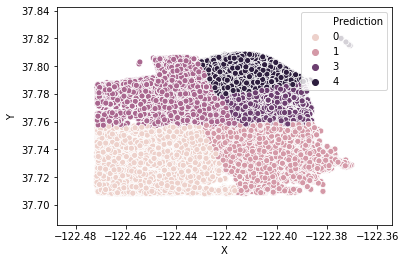

In [0]:
# Using Seaborn to display cluster
sb.scatterplot(data=transformed_pd, x="X", y="Y", hue="Prediction")
plt.show()

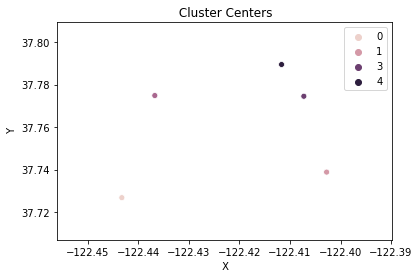

In [0]:
X_pos= [pos[0] for pos in model.clusterCenters()]
Y_pos= [pos[1] for pos in model.clusterCenters()]
ax= sb.scatterplot(x=X_pos,y=Y_pos, hue=[0,1,2,3,4] )
ax.set_xlabel(" X")
ax.set_ylabel(" Y")
ax.set_title(" Cluster Centers")
plt.show()

In [0]:
display(transformed.select(["Y","X"]))

Y,X
37.8021507619169,-122.439757857075
37.7799444052046,-122.414317857881
37.7375755833256,-122.388798895151
37.7245556697717,-122.401096851568
37.7967148853927,-122.398187664281
37.7899090887789,-122.444143357971
37.7546255872838,-122.41860030589
37.775420706711,-122.403404791479
37.7812532736369,-122.39123835272
37.7740339230512,-122.415567221314


#### Analysis:
1. From the scatter plot above, we can see that 5 clusters adjacent to each other around -122.42~-122.40 in X axis and 37.36~37.78 in Y axis and some centers of clusters get close to each other in this region. This tells us that this region has the most amount of crimes
2. From the area of each cluster, we can see that clusters 3 and 4 have the smallest areas, which mean crimes occur in these two region more frequently than other centers

#### Business Insights: 
1. more polices should be assigned to the regions of clusters 3 and 4 and polices in these two regions may need more equipments used to resolve crimes, such as handcuffs, siren and people live in these regions should prepare more devices to protect themseleves from crimes. We can sell these devices and equipments to  these region
2. The figures also tell us to avoid traveling those regions as well and the amount of visitors in clusters 0 and 1 may be more than amount in other clusters due to the amount of crimes in regions of clusters 3,4.

#### 8.3 Examples codes to test with StringIndexer and OnehotEncoder for future use

###### Example codes to Convert text data into numeric labels using StringIndexer

In [0]:
from  pyspark.ml.feature import StringIndexer
stringIndexer = StringIndexer()
stringIndexer.setInputCols(["category"])
stringIndexer.setOutputCols(["indexed_category"])
model = stringIndexer.fit(cluster_df.select(["category"]))
td = model.transform(cluster_df)
display(td)

Hour,PdDistrict,X,Y,DayOfWeek,category,Resolution,hasCriminal,indexed_category
8,NORTHERN,-122.439757857075,37.8021507619169,Friday,WARRANTS,"ARREST, BOOKED",true,7.0
14,TENDERLOIN,-122.414317857881,37.7799444052046,Tuesday,DRUG/NARCOTIC,"ARREST, BOOKED",true,5.0
13,BAYVIEW,-122.388798895151,37.7375755833256,Saturday,VEHICLE THEFT,NONE,true,4.0
2,CENTRAL,-122.414354301151,37.8031089840376,Thursday,NON-CRIMINAL,PSYCHOPATHIC CASE,false,2.0
8,BAYVIEW,-122.401096851568,37.7245556697717,Saturday,VEHICLE THEFT,NONE,true,4.0
17,CENTRAL,-122.398187664281,37.7967148853927,Sunday,LARCENY/THEFT,NONE,true,0.0
22,RICHMOND,-122.444143357971,37.7899090887789,Thursday,LARCENY/THEFT,NONE,true,0.0
16,MISSION,-122.41860030589,37.7546255872838,Friday,LARCENY/THEFT,NONE,true,0.0
11,SOUTHERN,-122.403404791479,37.775420706711,Thursday,LARCENY/THEFT,NONE,true,0.0
10,SOUTHERN,-122.39123835272,37.7812532736369,Thursday,BURGLARY,NONE,true,8.0


###### Example Codes to use One-Hot Encoding to convert numerical labels into 0, 1 representation

In [0]:
from pyspark.ml.feature import OneHotEncoder
ohe = OneHotEncoder()
ohe.setInputCols(["indexed_category" ])
ohe.setOutputCols(["oh_category" ])
ohe_model = ohe.fit(td)
td_new = ohe_model.transform(td)
display(td_new)

Hour,PdDistrict,X,Y,DayOfWeek,category,Resolution,hasCriminal,indexed_category,oh_category
8,NORTHERN,-122.439757857075,37.8021507619169,Friday,WARRANTS,"ARREST, BOOKED",true,7.0,"List(0, 37, List(7), List(1.0))"
14,TENDERLOIN,-122.414317857881,37.7799444052046,Tuesday,DRUG/NARCOTIC,"ARREST, BOOKED",true,5.0,"List(0, 37, List(5), List(1.0))"
13,BAYVIEW,-122.388798895151,37.7375755833256,Saturday,VEHICLE THEFT,NONE,true,4.0,"List(0, 37, List(4), List(1.0))"
2,CENTRAL,-122.414354301151,37.8031089840376,Thursday,NON-CRIMINAL,PSYCHOPATHIC CASE,false,2.0,"List(0, 37, List(2), List(1.0))"
8,BAYVIEW,-122.401096851568,37.7245556697717,Saturday,VEHICLE THEFT,NONE,true,4.0,"List(0, 37, List(4), List(1.0))"
17,CENTRAL,-122.398187664281,37.7967148853927,Sunday,LARCENY/THEFT,NONE,true,0.0,"List(0, 37, List(0), List(1.0))"
22,RICHMOND,-122.444143357971,37.7899090887789,Thursday,LARCENY/THEFT,NONE,true,0.0,"List(0, 37, List(0), List(1.0))"
16,MISSION,-122.41860030589,37.7546255872838,Friday,LARCENY/THEFT,NONE,true,0.0,"List(0, 37, List(0), List(1.0))"
11,SOUTHERN,-122.403404791479,37.775420706711,Thursday,LARCENY/THEFT,NONE,true,0.0,"List(0, 37, List(0), List(1.0))"
10,SOUTHERN,-122.39123835272,37.7812532736369,Thursday,BURGLARY,NONE,true,8.0,"List(0, 37, List(8), List(1.0))"


In [0]:
# ensemble multiple feature columns into one feature column
from pyspark.ml.feature import VectorAssembler
vecAssembler = VectorAssembler(inputCols=["X", "Y", "oh_category"], outputCol="features")
new_df = vecAssembler.transform(td_new.select(["X","Y","oh_category"]))
new_df.show()

+-----------------+----------------+---------------+--------------------+
 X| Y| oh_category| features|
+-----------------+----------------+---------------+--------------------+
-122.439757857075|37.8021507619169| (37,[7],[1.0])|(39,[0,1,9],[-122...|
-122.414317857881|37.7799444052046| (37,[5],[1.0])|(39,[0,1,7],[-122...|
-122.388798895151|37.7375755833256| (37,[4],[1.0])|(39,[0,1,6],[-122...|
-122.414354301151|37.8031089840376| (37,[2],[1.0])|(39,[0,1,4],[-122...|
-122.401096851568|37.7245556697717| (37,[4],[1.0])|(39,[0,1,6],[-122...|
-122.398187664281|37.7967148853927| (37,[0],[1.0])|(39,[0,1,2],[-122...|
-122.444143357971|37.7899090887789| (37,[0],[1.0])|(39,[0,1,2],[-122...|
 -122.41860030589|37.7546255872838| (37,[0],[1.0])|(39,[0,1,2],[-122...|
-122.403404791479| 37.775420706711| (37,[0],[1.0])|(39,[0,1,2],[-122...|
 -122.39123835272|37.7812532736369| (37,[8],[1.0])|(39,[0,1,10],[-12...|
-122.415567221314|37.7740339230512| (37,[0],[1.0])|(39,[0,1,2],[-122...|
-122.420339299422|37.7805648254405| (37,[0],[1.0])|(39,[0,1,2],[-122...|
-122.406460643507|37.7979466732983| (37,[7],[1.0])|(39,[0,1,9],[-122...|
-122.489043719408|37.7639645524977| (37,[0],[1.0])|(39,[0,1,2],[-122...|
-122.440168037474|37.7621873493017| (37,[1],[1.0])|(39,[0,1,3],[-122...|
-122.463763255095|37.7659314648911| (37,[6],[1.0])|(39,[0,1,8],[-122...|
-122.411324519026|37.8068042726193| (37,[8],[1.0])|(39,[0,1,10],[-12...|
-122.431014432295|37.7749021098117| (37,[0],[1.0])|(39,[0,1,2],[-122...|
-122.399802145799|37.7880065324392| (37,[1],[1.0])|(39,[0,1,3],[-122...|
-122.416872883664|37.7587640201132|(37,[17],[1.0])|(39,[0,1,19],[-12...|
+-----------------+----------------+---------------+--------------------+
only showing top 20 rows

In [0]:
from pyspark.ml.clustering import BisectingKMeans
bkm = BisectingKMeans(k=5, minDivisibleClusterSize=1.0)
model = bkm.fit(new_df)
display(new_df)

X,Y,oh_category,features
-122.439757857075,37.8021507619169,"List(0, 37, List(7), List(1.0))","List(0, 39, List(0, 1, 9), List(-122.439757857075, 37.8021507619169, 1.0))"
-122.414317857881,37.7799444052046,"List(0, 37, List(5), List(1.0))","List(0, 39, List(0, 1, 7), List(-122.414317857881, 37.7799444052046, 1.0))"
-122.388798895151,37.7375755833256,"List(0, 37, List(4), List(1.0))","List(0, 39, List(0, 1, 6), List(-122.388798895151, 37.7375755833256, 1.0))"
-122.414354301151,37.8031089840376,"List(0, 37, List(2), List(1.0))","List(0, 39, List(0, 1, 4), List(-122.414354301151, 37.8031089840376, 1.0))"
-122.401096851568,37.7245556697717,"List(0, 37, List(4), List(1.0))","List(0, 39, List(0, 1, 6), List(-122.401096851568, 37.7245556697717, 1.0))"
-122.398187664281,37.7967148853927,"List(0, 37, List(0), List(1.0))","List(0, 39, List(0, 1, 2), List(-122.398187664281, 37.7967148853927, 1.0))"
-122.444143357971,37.7899090887789,"List(0, 37, List(0), List(1.0))","List(0, 39, List(0, 1, 2), List(-122.444143357971, 37.7899090887789, 1.0))"
-122.41860030589,37.7546255872838,"List(0, 37, List(0), List(1.0))","List(0, 39, List(0, 1, 2), List(-122.41860030589, 37.7546255872838, 1.0))"
-122.403404791479,37.775420706711,"List(0, 37, List(0), List(1.0))","List(0, 39, List(0, 1, 2), List(-122.403404791479, 37.775420706711, 1.0))"
-122.39123835272,37.7812532736369,"List(0, 37, List(8), List(1.0))","List(0, 39, List(0, 1, 10), List(-122.39123835272, 37.7812532736369, 1.0))"


### Optional part: Time series analysis
This part is not based on Spark, and only based on Pandas Time Series package.   
Note: I am not familiar with time series model, please refer the ARIMA model introduced by other teacher.   
process:  
1.visualize time series  
2.plot ACF and find optimal parameter  
3.Train ARIMA  
4.Prediction 

Refer:   
https://zhuanlan.zhihu.com/p/35282988  
https://zhuanlan.zhihu.com/p/35128342  
https://www.statsmodels.org/dev/examples/notebooks/generated/tsa_arma_0.html  
https://www.howtoing.com/a-guide-to-time-series-forecasting-with-arima-in-python-3  
https://www.joinquant.com/post/9576?tag=algorithm  
https://blog.csdn.net/u012052268/article/details/79452244  

#### Q9 Time Series analysis: Analyze the relationship between infection of Covid19 and Count of Crime in SF 2020


In [0]:
#Dataset link
#COVID 2019
# https://data.sfgov.org/resource/d2ef-idww.csv
#SF Crime 2018 to Present
#https://data.sfgov.org/resource/wg3w-h783.csv

#### Q9.1 load new datasets from sfgov website:  dataset of SF crime from 2018 to present,    COVID19 dataset

In [0]:
import urllib.request
#covid19 data
urllib.request.urlretrieve("https://data.sfgov.org/resource/d2ef-idww.csv", "/tmp/mycvoid.csv")
dbutils.fs.mv("file:/tmp/mycvoid.csv", "dbfs:/laioffer/spark_hw1/data/covid19.csv")
#sf crime data 2018~present
urllib.request.urlretrieve("https://data.sfgov.org/resource/wg3w-h783.csv", "/tmp/mycrime.csv")
dbutils.fs.mv("file:/tmp/mycrime.csv", "dbfs:/laioffer/spark_hw1/data/sf_2018_present.csv")
display(dbutils.fs.ls("dbfs:/laioffer/spark_hw1/data/"))
crime_data_path = "dbfs:/laioffer/spark_hw1/data/sf_2018_present.csv"
covid_data_path = "dbfs:/laioffer/spark_hw1/data/covid19.csv"

path,name,size
dbfs:/laioffer/spark_hw1/data/covid19.csv,covid19.csv,11614221
dbfs:/laioffer/spark_hw1/data/sf_03_18.csv,sf_03_18.csv,559169754
dbfs:/laioffer/spark_hw1/data/sf_2018_present.csv,sf_2018_present.csv,443120


In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import to_date, to_timestamp, hour
from pyspark.sql.functions import year, month, dayofmonth, date_format
from pyspark.sql.functions import from_unixtime, unix_timestamp
# create SparkSession entry to handle data
spark = SparkSession \
    .builder \
    .appName("crime analysis") \
    .config("spark.some.config.option", "some-value") \
    .getOrCreate()
# load csv data and create a table called sf_crime
df_covid = spark.read.option("header", "true").csv(covid_data_path)
display(df_covid)


specimen_collection_date,area_type,id,acs_population,new_confirmed_cases,cumulative_confirmed_cases,rate_of_cumulative_confirmed_case,multipolygon,last_updated_at
2020-03-03T00:00:00.000,Citywide,Citywide,870044,2,2.0,null,null,2020-10-10T18:01:22.180
2020-03-04T00:00:00.000,Citywide,Citywide,870044,0,2.0,null,null,2020-10-10T18:01:22.180
2020-03-05T00:00:00.000,Citywide,Citywide,870044,6,8.0,null,null,2020-10-10T18:01:22.180
2020-03-06T00:00:00.000,Citywide,Citywide,870044,0,8.0,null,null,2020-10-10T18:01:22.180
2020-03-07T00:00:00.000,Citywide,Citywide,870044,5,13.0,null,null,2020-10-10T18:01:22.180
2020-03-08T00:00:00.000,Citywide,Citywide,870044,1,14.0,null,null,2020-10-10T18:01:22.180
2020-03-09T00:00:00.000,Citywide,Citywide,870044,0,14.0,null,null,2020-10-10T18:01:22.180
2020-03-10T00:00:00.000,Citywide,Citywide,870044,6,20.0,null,null,2020-10-10T18:01:22.180
2020-03-11T00:00:00.000,Citywide,Citywide,870044,9,29.0,0.33331647594834285,null,2020-10-10T18:01:22.180
2020-03-12T00:00:00.000,Citywide,Citywide,870044,6,35.0,0.4022785054548966,null,2020-10-10T18:01:22.180


#### Q9.2.1 Data Cleaning for covid19 dataset
1. Convert the data from string to other correct data type, like date, int, double
2. select data features we are interested in, like  cumulative confirmed cases, new confirmed cases, collection date, etc

In [0]:
# # decompose date

from pyspark.sql.functions import col, udf
from pyspark.sql.functions import expr
from pyspark.sql.functions import from_unixtime 
import datetime
date_func =  udf (lambda x: datetime.datetime.strptime(x, '%Y-%m-%dT%H:%M:%S.%f'), DateType())

df_covid = df_covid.withColumn('collect_Date', date_func(col('specimen_collection_date'))).drop(df_covid["specimen_collection_date"])
df_covid = df_covid.withColumn("Year", year(df_covid["collect_Date"]))
df_covid = df_covid.withColumn("Month", month(df_covid["collect_Date"]))
df_covid = df_covid.withColumn("cumulative_confirmed_cases", df_covid["cumulative_confirmed_cases"].cast("float"))  
df_covid = df_covid.withColumn("new_confirmed_cases", df_covid["new_confirmed_cases"].cast("float"))  
df_covid = df_covid.withColumn("acs_population", df_covid["acs_population"].cast("int"))  
display(df_covid)

area_type,id,acs_population,new_confirmed_cases,cumulative_confirmed_cases,rate_of_cumulative_confirmed_case,multipolygon,last_updated_at,collect_Date,Year,Month
Citywide,Citywide,870044,2.0,2.0,null,null,2020-10-10T18:01:22.180,2020-03-03,2020,3
Citywide,Citywide,870044,0.0,2.0,null,null,2020-10-10T18:01:22.180,2020-03-04,2020,3
Citywide,Citywide,870044,6.0,8.0,null,null,2020-10-10T18:01:22.180,2020-03-05,2020,3
Citywide,Citywide,870044,0.0,8.0,null,null,2020-10-10T18:01:22.180,2020-03-06,2020,3
Citywide,Citywide,870044,5.0,13.0,null,null,2020-10-10T18:01:22.180,2020-03-07,2020,3
Citywide,Citywide,870044,1.0,14.0,null,null,2020-10-10T18:01:22.180,2020-03-08,2020,3
Citywide,Citywide,870044,0.0,14.0,null,null,2020-10-10T18:01:22.180,2020-03-09,2020,3
Citywide,Citywide,870044,6.0,20.0,null,null,2020-10-10T18:01:22.180,2020-03-10,2020,3
Citywide,Citywide,870044,9.0,29.0,0.33331647594834285,null,2020-10-10T18:01:22.180,2020-03-11,2020,3
Citywide,Citywide,870044,6.0,35.0,0.4022785054548966,null,2020-10-10T18:01:22.180,2020-03-12,2020,3


In [0]:
df_new_confirmed = df_covid.select(['new_confirmed_cases',"collect_Date"])
display(df_new_confirmed)

new_confirmed_cases,collect_Date
2.0,2020-03-03
0.0,2020-03-04
6.0,2020-03-05
0.0,2020-03-06
5.0,2020-03-07
1.0,2020-03-08
0.0,2020-03-09
6.0,2020-03-10
9.0,2020-03-11
6.0,2020-03-12


In [0]:
df_cumul_confirmed = df_covid.select(['cumulative_confirmed_cases',"collect_Date"])
display(df_cumul_confirmed)

cumulative_confirmed_cases,collect_Date
2.0,2020-03-03
2.0,2020-03-04
8.0,2020-03-05
8.0,2020-03-06
13.0,2020-03-07
14.0,2020-03-08
14.0,2020-03-09
20.0,2020-03-10
29.0,2020-03-11
35.0,2020-03-12


#### Using moving average to get the trend of the time series data with window =10 

In [0]:
df_new_confirmed_pd=df_new_confirmed.toPandas()
df_new_confirmed_pd["moving_average"] = df_new_confirmed_pd["new_confirmed_cases"].rolling(window=10).mean()
display(df_new_confirmed_pd)

new_confirmed_cases,collect_Date,moving_average
2.0,2020-03-03,null
0.0,2020-03-04,null
6.0,2020-03-05,null
0.0,2020-03-06,null
5.0,2020-03-07,null
1.0,2020-03-08,null
0.0,2020-03-09,null
6.0,2020-03-10,null
9.0,2020-03-11,null
6.0,2020-03-12,3.5


#### Q9.2.2 Load SF Crime data from 2018 to present

In [0]:
from pyspark.sql import functions as F
# load sf crime data from 2018 - present
date_func2 =  udf (lambda x: datetime.datetime.strptime(x, '%Y-%m-%dT%H:%M:%S.%f'), DateType())
df_sf_crime =spark.read.option("header", "true").csv(crime_data_path)

display(df_sf_crime)


incident_datetime,incident_date,incident_time,incident_year,incident_day_of_week,report_datetime,row_id,incident_id,incident_number,cad_number,report_type_code,report_type_description,filed_online,incident_code,incident_category,incident_subcategory,incident_description,resolution,intersection,cnn,police_district,analysis_neighborhood,supervisor_district,latitude,longitude,point,:@computed_region_6qbp_sg9q,:@computed_region_qgnn_b9vv,:@computed_region_26cr_cadq,:@computed_region_ajp5_b2md,:@computed_region_nqbw_i6c3,:@computed_region_2dwj_jsy4,:@computed_region_h4ep_8xdi,:@computed_region_y6ts_4iup,:@computed_region_jg9y_a9du,:@computed_region_6pnf_4xz7
2020-08-15T12:43:00.000,2020-08-15T00:00:00.000,12:43,2020,Saturday,2020-08-15T12:58:00.000,95308704134,953087,200490354,202281583,II,Initial,null,04134,Assault,Simple Assault,Battery,Open or Active,GENEVA AVE \ LONDON ST,21475000,Ingleside,Excelsior,11,37.716038818883085,-122.44025513581519,,null,null,null,null,null,null,null,null,null,null
null,,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
(37.716038818883085,"-122.44025513581519)""",58,9,1,7,null,null,null,null,null,2,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2018-01-18T19:00:00.000,2018-01-18T00:00:00.000,19:00,2018,Thursday,2018-01-22T16:59:00.000,64999771000,649997,186068683,null,II,Coplogic Initial,true,71000,Lost Property,Lost Property,Lost Property,Open or Active,null,null,Out of SF,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2020-08-16T03:13:00.000,2020-08-16T00:00:00.000,03:13,2020,Sunday,2020-08-16T03:14:00.000,95319604083,953196,200491669,202290313,II,Initial,null,04083,Assault,Aggravated Assault,"Firearm, Discharging in Grossly Negligent Manner",Open or Active,23RD ST \ ARKANSAS ST,23642000,Bayview,Potrero Hill,10,37.75482657770952,-122.39772873392515,,null,null,null,null,null,null,null,null,null,null
null,,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
(37.75482657770952,"-122.39772873392515)""",54,2,9,26,null,null,null,null,null,2,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2020-08-16T03:38:00.000,2020-08-16T00:00:00.000,03:38,2020,Sunday,2020-08-16T04:56:00.000,95326228100,953262,200491738,202290404,II,Initial,null,28100,Malicious Mischief,Vandalism,"Malicious Mischief, Breaking Windows",Open or Active,VALENCIA ST \ 15TH ST,24377000,Mission,Mission,9,37.76653957529556,-122.42204381448558,,null,null,null,null,null,null,null,null,null,null
null,,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
(37.76653957529556,"-122.42204381448558)""",53,3,2,20,3,null,null,null,null,2,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null


We can see that the crime dataset is dirty in incident_datetime, many rows contain wrong info, for example, incident datetime columns contains the information of latitude and longitude. So we need to clean the data

#### Clean dataset
1. **Remove Invalid rows:** we can see the many rows of dataset are not correct. For example, longitude and latitude information is placed in the column of incident date.
2. Convert String data type to suitable data type, like date, double, int
3. Select the features we are interested in.  Here I'm interested in the category of crime, date, district, etc

In [0]:
# data cleaning 
#Using regular expression to find valid string date and then remove invalid rows
df_sf_crime = df_sf_crime.withColumn("Date_Str", F.regexp_extract(df_sf_crime["incident_datetime"], r"[0-9]+(-)[0-9]+(-)[0-9]+(T)[0-9]+(:)[0-9]+(:)[0-9]+(.)[0-9]+",0))
df_sf_crime = df_sf_crime.where("Date_Str !='null' and Date_Str!=''")
df_sf_crime = df_sf_crime.withColumn("incident_date", date_func2(col('Date_Str')))
# convert data type to correct data type
df_sf_crime = df_sf_crime.withColumn("incident_Hour", hour(col("incident_time")))

df_sf_crime = df_sf_crime.withColumn("incident_year", col("incident_year").cast("int"))
df_sf_crime = df_sf_crime.withColumn("latitude", col("latitude").cast("double"))
df_sf_crime = df_sf_crime.withColumn("longitude", col("longitude").cast("double"))
df_sf_crime = df_sf_crime.withColumn("report_date", date_func2(col("report_datetime")))
df_sf_crime = df_sf_crime.select(["incident_Hour","incident_year",\
                             "incident_date","incident_time","incident_day_of_week",\
                                "incident_number","incident_category","incident_subcategory","incident_description",\
                                  "resolution","report_date","intersection","police_district","latitude","longitude"])
display(df_sf_crime)

incident_Hour,incident_date,incident_time,incident_day_of_week,incident_number,incident_category,incident_subcategory,incident_description,resolution,report_date,intersection,police_district,latitude,longitude
12,2020-08-15,12:43,Saturday,200490354,Assault,Simple Assault,Battery,Open or Active,2020-08-15,GENEVA AVE \ LONDON ST,Ingleside,37.716038818883085,-122.44025513581519
19,2018-01-18,19:00,Thursday,186068683,Lost Property,Lost Property,Lost Property,Open or Active,2018-01-22,null,Out of SF,null,null
3,2020-08-16,03:13,Sunday,200491669,Assault,Aggravated Assault,"Firearm, Discharging in Grossly Negligent Manner",Open or Active,2020-08-16,23RD ST \ ARKANSAS ST,Bayview,37.75482657770952,-122.39772873392515
3,2020-08-16,03:38,Sunday,200491738,Malicious Mischief,Vandalism,"Malicious Mischief, Breaking Windows",Open or Active,2020-08-16,VALENCIA ST \ 15TH ST,Mission,37.76653957529556,-122.42204381448558
9,2020-08-15,09:40,Saturday,206121692,Larceny Theft,Larceny - From Vehicle,"Theft, From Locked Vehicle, >$950",Open or Active,2020-08-15,null,Park,null,null
13,2020-08-16,13:40,Sunday,200492463,Non-Criminal,Other,Mental Health Detention,Open or Active,2020-08-16,04TH ST \ MINNA ST,Southern,37.78404443715923,-122.40371175457705
16,2020-08-16,16:18,Sunday,200492792,Weapons Offense,Weapons Offense,"Weapon, Carrying Concealed with Felony or Narcotics Conviction",Cite or Arrest Adult,2020-08-16,ORTEGA ST \ 48TH AVE,Taraval,37.751003283475306,-122.50741622958954
22,2020-08-12,22:00,Wednesday,200489880,Missing Person,Missing Adult,Missing Adult,Open or Active,2020-08-15,FILLMORE ST \ TURK ST,Northern,37.78049625961115,-122.43214039079034
14,2020-08-14,14:00,Friday,206121551,Larceny Theft,Larceny - From Vehicle,"Theft, From Locked Vehicle, >$950",Open or Active,2020-08-15,HEMLOCK ST \ LAGUNA ST,Northern,37.786246576578144,-122.42824149689217
11,2020-08-16,11:13,Sunday,200492350,Other,Other,"Death Report, Cause Unknown",Open or Active,2020-08-16,HYDE ST \ CALIFORNIA ST,Central,37.790973190511274,-122.41739133606869


In [0]:
df_sf_crime.createOrReplaceTempView("present_sf_crime")
df_crime_count =spark.sql(" with sf_crime_count as (select incident_date , incident_category from present_sf_crime where incident_category not in ('Non-Criminal'))\
                          select incident_date, count(incident_date) as crime_count \
                          from sf_crime_count \
                          group by incident_date \
                          order by incident_date asc")
display(df_crime_count)

incident_date,crime_count
2018-01-03,2
2018-01-18,1
2019-02-03,1
2019-05-01,2
2019-08-01,1
2019-08-16,1
2019-12-08,1
2019-12-11,2
2019-12-17,1
2020-01-15,1


In [0]:
df_crime_count_2020 =spark.sql(" with sf_crime_count as (select incident_date , incident_category from present_sf_crime where incident_category not in ('Non-Criminal'))\
                          select incident_date, count(incident_date) as crime_count \
                          from sf_crime_count \
                          group by incident_date having year(incident_date) =2020\
                          order by incident_date asc")
display(df_crime_count_2020)

incident_date,crime_count
2020-01-15,1
2020-01-30,1
2020-02-05,2
2020-02-26,4
2020-02-27,2
2020-02-28,2
2020-02-29,1
2020-03-18,1
2020-03-19,1
2020-04-01,1


In [0]:
df_crime_count_2020_pd =df_crime_count_2020.toPandas()

,incident_date,crime_count
0,2020-01-15,1
1,2020-01-30,1
2,2020-02-05,2
3,2020-02-26,4
4,2020-02-27,2


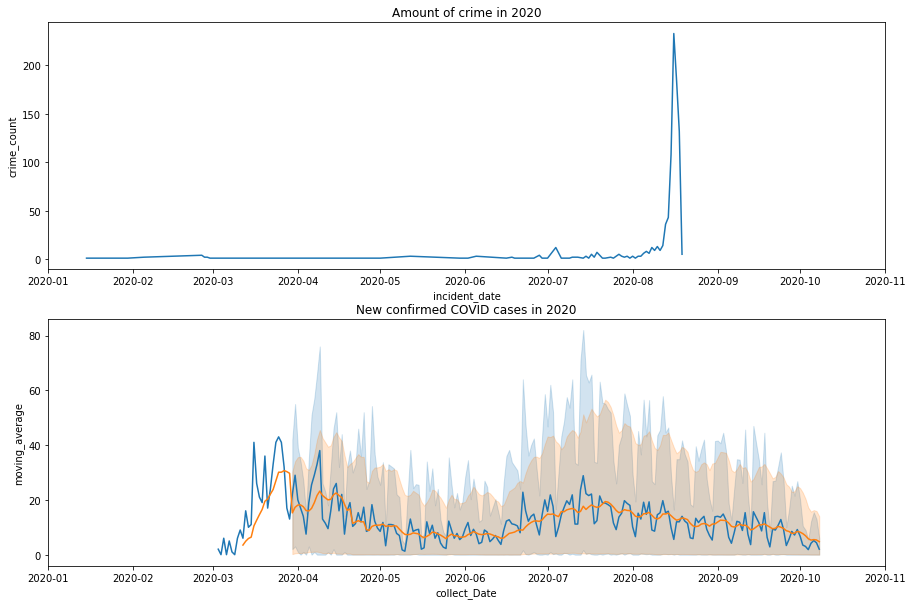

In [0]:
fig, ax =plt.subplots(2, figsize=(15,10))


sb.lineplot(x=df_crime_count_2020_pd["incident_date"],y=df_crime_count_2020_pd["crime_count"], ax=ax[0])
sb.lineplot(data = df_new_confirmed_pd, x="collect_Date",y="new_confirmed_cases", ax=ax[1])
sb.lineplot(data = df_new_confirmed_pd, x="collect_Date",y="moving_average", ax=ax[1])
ax[0].set_xlim(datetime.date(2020,1,1),datetime.date(2020,11,1))
ax[0].set_title("Amount of crime in 2020")
ax[1].set_xlim(datetime.date(2020,1,1),datetime.date(2020,11,1))
ax[1].set_title("New confirmed COVID cases in 2020")
plt.show(ax.fig)

In [0]:
cat_crime = spark.sql("with crime_count as (select incident_date , incident_category from present_sf_crime where incident_category not in ('Non-Criminal')) \
          select incident_date , incident_category, count(incident_category) as cat_crime_count\
          from crime_count\
          group by incident_date , incident_category order by  incident_date")
display(cat_crime)

incident_date,incident_category,cat_crime_count
2018-01-03,Recovered Vehicle,2
2018-01-18,Lost Property,1
2019-02-03,Suspicious Occ,1
2019-05-01,Sex Offense,1
2019-05-01,Case Closure,1
2019-08-01,Missing Person,1
2019-08-16,Malicious Mischief,1
2019-12-08,Lost Property,1
2019-12-11,Sex Offense,1
2019-12-11,Case Closure,1


#### Analysis
1. we can see that there are two peaks in the new confirmed cased COVID line plot, on April, July respectively. The peak in 2020-04 is the first exploration of COVID19, while the second peak is due to the social events, like parade and violent events.
2. The peak in the plot of count of crime is on August, close to the second peak in the COVID19 figure. This may imply that after July 2020, more and more people ignore the COVID 19 and expose outside for social events, which make the criminals dare to  make crimes again
3. From the bar plot of incident category, we can see that most of crimes are larceny theft , burglary and assault. It may be due to the economy recession and loss of jobs during COVID19 period, which make people become poor and tend to rob and steal money to survive.

#### How to implement a inner join/ left join/right join via Python? 选做哈

For example 

Array 1: [[1, "mike", "f"], [2, "jason", "f"], [3, "robin", "m"], ...] 

Array 2: [[1, "95051", "CS"], [2, "95001", "DS"], [6, "robin", "DE"], ...]